In [2]:

import kagglehub
robikscube_textocr_text_extraction_from_images_dataset_path = kagglehub.dataset_download('robikscube/textocr-text-extraction-from-images-dataset')

print('Data source import complete.')


Data source import complete.


In [3]:
# Install required libraries
!pip install keras-ocr tensorflow==2.12.0
!pip install numpy matplotlib
!pip install easyocr  # <- Add this line

# Now import
import keras_ocr
import easyocr

# Initialize OCR models
pipeline = keras_ocr.pipeline.Pipeline()  # Keras OCR
reader = easyocr.Reader(['en'], gpu=True)  # EasyOCR


Looking for /root/.keras-ocr/craft_mlt_25k.h5
Looking for /root/.keras-ocr/crnn_kurapan.h5


To compare EasyOCR and Keras OCR on the dataset from Kaggle, you can follow the steps below. This code will load the dataset, apply both OCR models to extract text, and then compare their performance based on accuracy or other metrics like speed, F1 score, etc.

Steps:
Install Dependencies: Make sure you have the required libraries installed.
Load Dataset: Load the images from the Kaggle dataset.
Run OCR Models: Use EasyOCR and Keras OCR on the dataset.
Evaluate Performance: Compare the output using metrics such as accuracy or timing.

# Import necessary libraries


In [4]:
# Import necessary libraries
import pandas as pd
import numpy as np

from glob import glob
from tqdm.notebook import tqdm

import matplotlib.pyplot as plt
from PIL import Image

# Load the annotation data from CSV and image data from parquet

In [5]:
annot = pd.read_csv('/kaggle/input/textocr-text-extraction-from-images-dataset/annot.csv')
imgs = pd.read_parquet('/kaggle/input/textocr-text-extraction-from-images-dataset/img.parquet')

# Load image paths
# Use glob to find all image files in the specified directory
images = glob('/kaggle/input/textocr-text-extraction-from-images-dataset/train_val_images/train_images/*.jpg')  # Corrected to include *.jpg


# Display first few rows of the annotations and images data

In [6]:
print("Annotations Data:")
print(annot.head())
print("\nImages Data:")
print(imgs.head())

Annotations Data:
   Unnamed: 0                  id          image_id  \
0           0  a4ea732cd3d5948a_1  a4ea732cd3d5948a   
1           1  a4ea732cd3d5948a_2  a4ea732cd3d5948a   
2           2  a4ea732cd3d5948a_3  a4ea732cd3d5948a   
3           3  a4ea732cd3d5948a_4  a4ea732cd3d5948a   
4           4  a4ea732cd3d5948a_5  a4ea732cd3d5948a   

                            bbox  utf8_string  \
0   [525.83, 3.4, 197.64, 33.94]  Performance   
1  [534.67, 64.68, 91.22, 38.19]        Sport   
2  [626.95, 63.62, 96.52, 31.82]        Watch   
3  [577.4, 141.87, 147.13, 43.1]   ...period.   
4  [391.03, 163.9, 60.82, 38.65]            .   

                                              points     area  
0  [525.83, 3.4, 723.47, 7.29, 722.76, 36.99, 525...  6707.90  
1  [535.73, 64.68, 623.41, 67.51, 625.89, 102.87,...  3483.69  
2  [626.95, 63.62, 721.7, 63.62, 723.47, 95.44, 6...  3071.27  
3  [580.02, 143.61, 724.53, 141.87, 723.66, 184.9...  6341.30  
4  [395.2, 163.9, 451.85, 191.94, 44

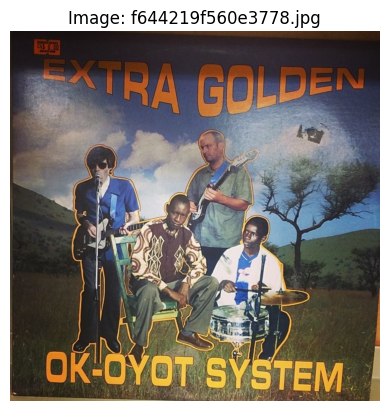

In [7]:
# Visualize the first image with their corresponding annotations

img_path = images[0]  # Get the image path
image = Image.open(img_path)  # Open the image
plt.imshow(image)  # Display the image
plt.axis('off')  # Hide axes
plt.title(f"Image: {img_path.split('/')[-1]}")  # Title as the image name
plt.show()

In [8]:
image_id = images[0].split('/')[-1].split('.')[0]
annot.query('image_id == @image_id')

,Unnamed: 0,id,image_id,bbox,utf8_string,points,area
674889,674889,f644219f560e3778_1,f644219f560e3778,"[64.54, 22.34, 75.25, 47.22]",.,"[67.49, 22.34, 139.79, 28.25, 139.79, 69.56, 6...",3553.30
674890,674890,f644219f560e3778_2,f644219f560e3778,"[68.97, 62.18, 419.03, 191.81]",EXTRA,"[77.82, 62.18, 488.0, 71.03, 483.57, 253.99, 6...",80374.14
674891,674891,f644219f560e3778_3,f644219f560e3778,"[510.13, 81.36, 486.9, 180.01]",GOLDEN,"[511.6, 81.36, 995.55, 82.84, 997.03, 242.19, ...",87646.87
674892,674892,f644219f560e3778_4,f644219f560e3778,"[89.63, 876.63, 432.3, 118.03]",OK-OYOT,"[91.1, 876.63, 521.93, 889.91, 521.93, 994.66,...",51024.37
674893,674893,f644219f560e3778_5,f644219f560e3778,"[532.26, 892.86, 402.8, 118.03]",SYSTEM,"[532.26, 892.86, 935.06, 910.56, 930.63, 1010....",47542.48


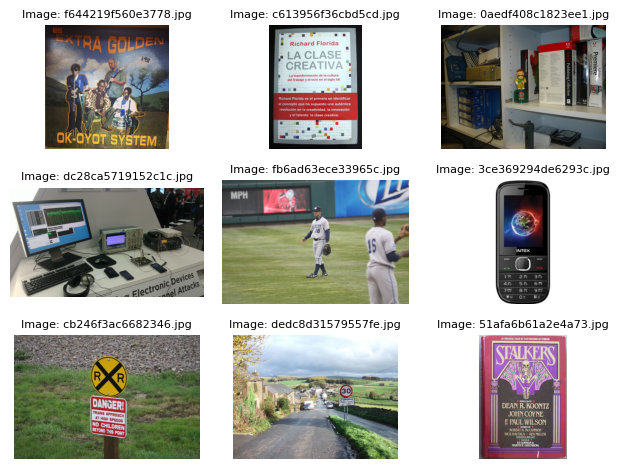

In [9]:
# Display the first 9 images in a 3x3 grid
for i in range(9):  # Loop through the first 9 images
    img_path = images[i]  # Get the image path
    image = Image.open(img_path)  # Open the image

    plt.subplot(3, 3, i + 1)  # Create a subplot in a 3x3 grid
    plt.imshow(image)  # Display the image
    plt.axis('off')  # Hide axes
    plt.title(f"Image: {img_path.split('/')[-1]}",fontsize=8)  # Title as the image name

plt.tight_layout()  # Adjust layout to prevent overlap
plt.show()


# Initialize OCR models


In [10]:
# Install required libraries
!pip install keras-ocr tensorflow==2.12.0
!pip install numpy matplotlib
!pip install easyocr  # <- Add this line

# Now import
import keras_ocr
import easyocr

# Initialize OCR models
pipeline = keras_ocr.pipeline.Pipeline()  # Keras OCR
reader = easyocr.Reader(['en'], gpu=True)  # EasyOCR


Looking for /root/.keras-ocr/craft_mlt_25k.h5
Looking for /root/.keras-ocr/crnn_kurapan.h5


# Function to process OCR results


In [11]:
# Function to process EasyOCR results
def get_easyocr_results(image_paths):
    dfs = []
    for img in tqdm(image_paths):
        result = reader.readtext(img)
        img_id = img.split('/')[-1].split('.')[0]
        img_df = pd.DataFrame(result, columns=['bbox', 'text', 'conf'])
        img_df['img_id'] = img_id
        dfs.append(img_df)
    return pd.concat(dfs)

# Function to process Keras OCR results
def get_kerasocr_results(image_paths):
    dfs = []
    for img in tqdm(image_paths):
        results = pipeline.recognize([img])
        img_id = img.split('/')[-1].split('.')[0]
        img_df = pd.DataFrame(results[0], columns=['text', 'bbox'])
        img_df['img_id'] = img_id
        dfs.append(img_df)
    return pd.concat(dfs)


**bold text**# Get results for EasyOCR and Keras OCR



In [12]:
# Get results for EasyOCR and Keras OCR
easyocr_df = get_easyocr_results(images[:25])  # Use first 25 images for EasyOCR
kerasocr_df = get_kerasocr_results(images[:25])  # Use first 25 images for Keras OCR


  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

1/1 [==============================] - 7s 7s/step


# Function to plot comparison between EasyOCR and Keras OCR results


In [13]:
def plot_compare(img_fn, easyocr_df, kerasocr_df):
    img_id = img_fn.split('/')[-1].split('.')[0]  # Extract the image ID
    fig, axs = plt.subplots(1, 2, figsize=(15, 10))

    # EasyOCR results for the current image
    easy_results = easyocr_df.query('img_id == @img_id')[['text', 'bbox']].values.tolist()
    easy_results = [(x[0], np.array(x[1])) for x in easy_results]  # Format as (text, bbox) pairs

    # Visualize EasyOCR results
    keras_ocr.tools.drawAnnotations(plt.imread(img_fn), easy_results, ax=axs[0])
    axs[0].set_title('EasyOCR Results', fontsize=24)

    # Keras OCR results for the current image
    keras_results = kerasocr_df.query('img_id == @img_id')[['text', 'bbox']].values.tolist()
    keras_results = [(x[0], np.array(x[1])) for x in keras_results]  # Format as (text, bbox) pairs

    # Visualize Keras OCR results
    keras_ocr.tools.drawAnnotations(plt.imread(img_fn), keras_results, ax=axs[1])
    axs[1].set_title('Keras OCR Results', fontsize=24)

    # Show the comparison plot
    plt.show()

# Example usage: visualize OCR results for the first image


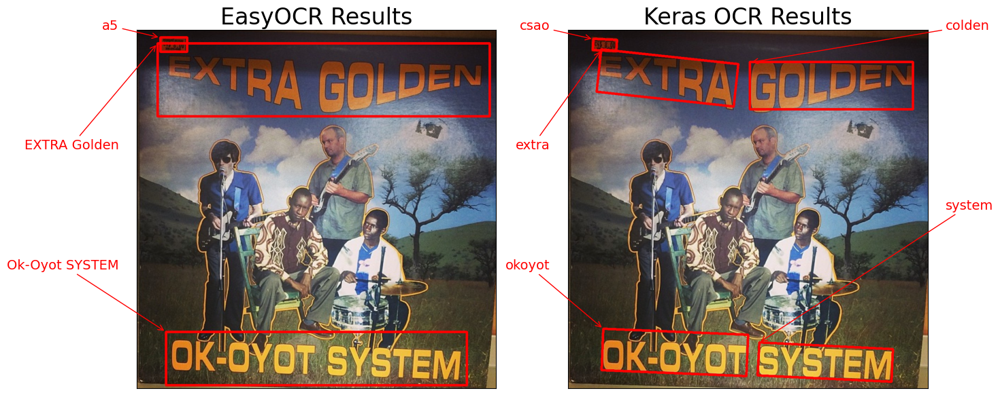

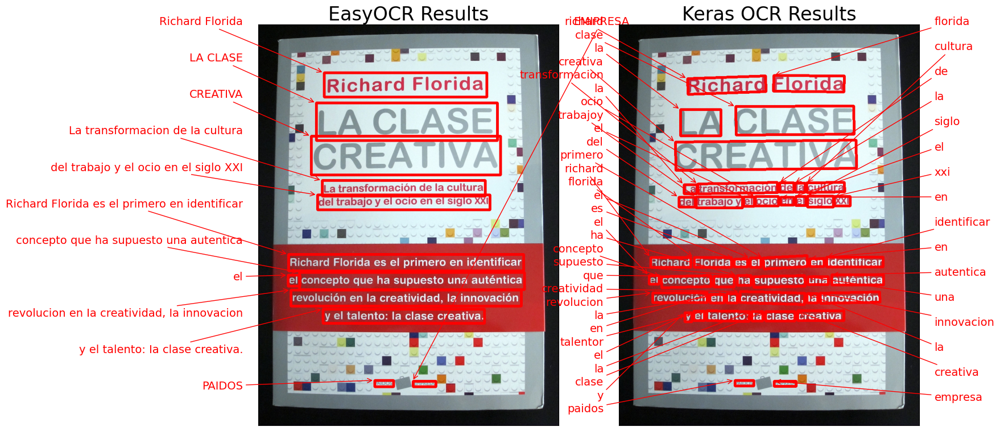

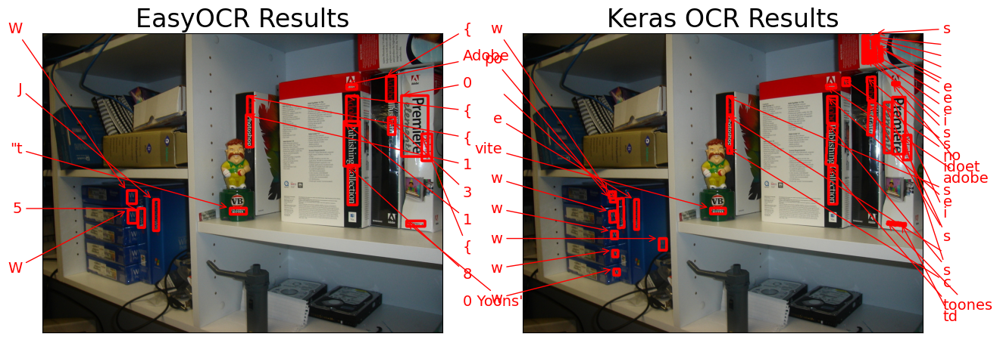

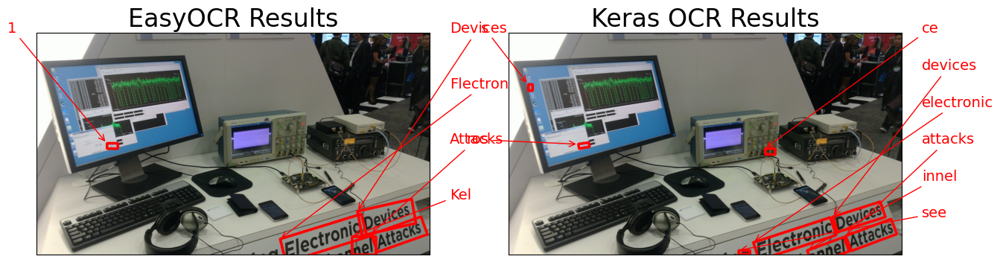

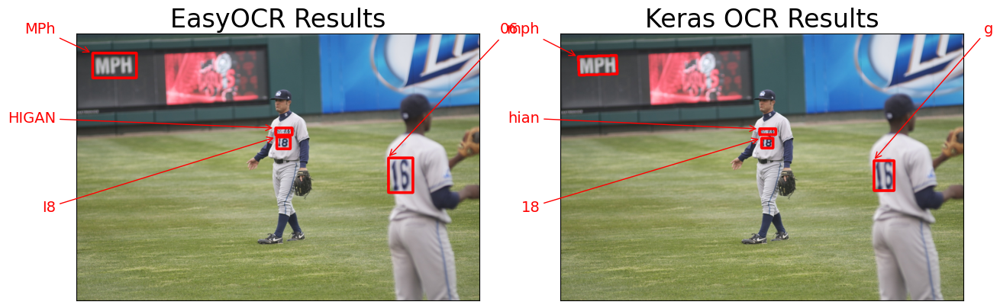

...

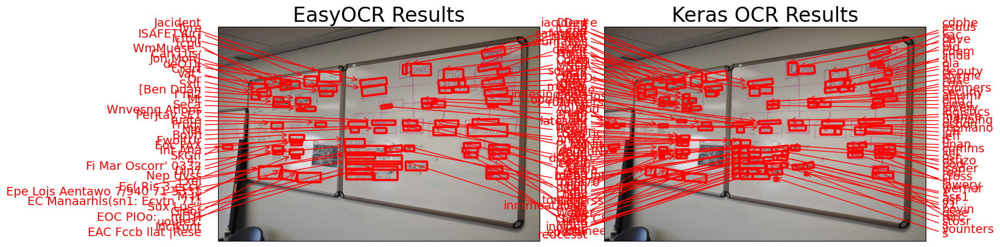

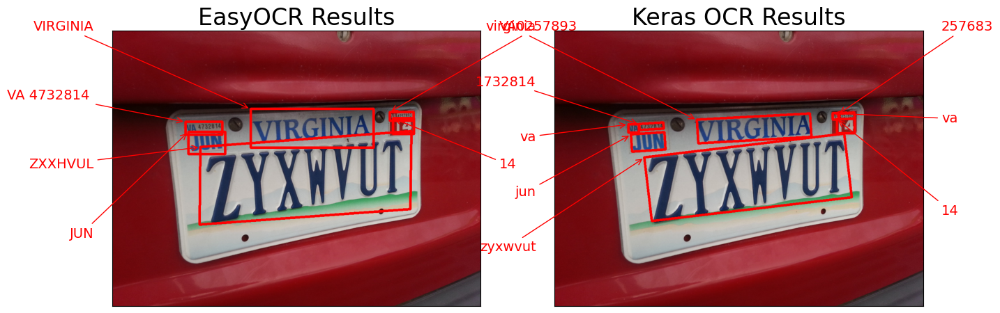

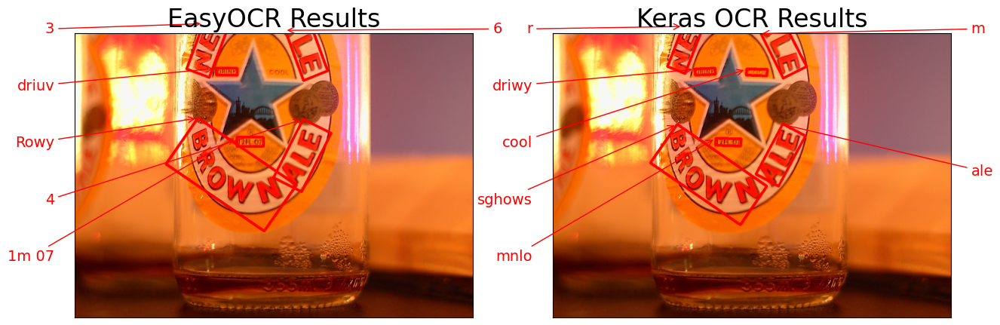

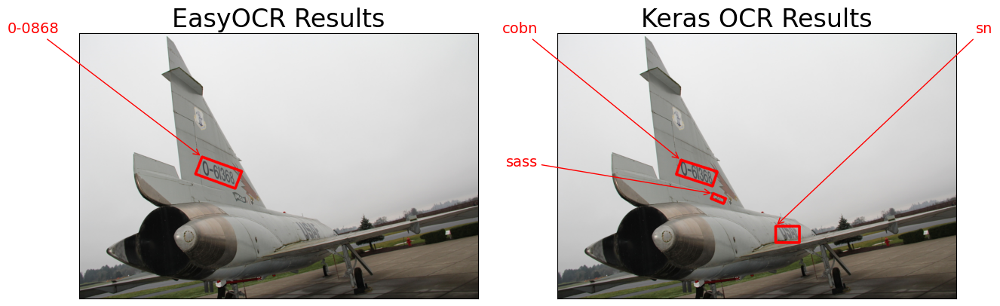

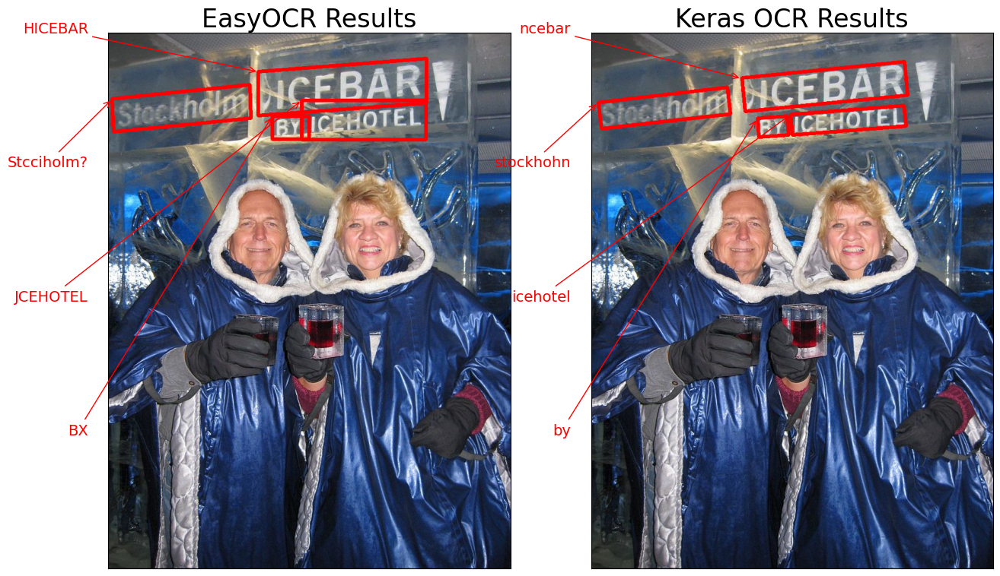

In [14]:
for img_path in images[:20]:  # Adjust the range as needed
    plot_compare(img_path, easyocr_df, kerasocr_df)

**Prepare Ground Truth Data**

In [16]:
import kagglehub

# Re-download or reconnect the dataset
robikscube_textocr_text_extraction_from_images_dataset_path = kagglehub.dataset_download('robikscube/textocr-text-extraction-from-images-dataset')


In [18]:
import pandas as pd
import os
from glob import glob

# Load annotation and image files
annot = pd.read_csv('/kaggle/input/textocr-text-extraction-from-images-dataset/annot.csv')
images = glob('/kaggle/input/textocr-text-extraction-from-images-dataset/train_val_images/train_images/*.jpg')

# Get first 25 image IDs
image_ids_subset = [os.path.basename(img).split('.')[0] for img in images[:25]]

# Filter annotations for the subset of images
annot_subset = annot[annot['image_id'].isin(image_ids_subset)].copy()

# Normalize ground-truth text
annot_subset['gt_text'] = annot_subset['utf8_string'].str.lower().str.strip()


In [20]:
from sklearn.metrics import precision_score, recall_score, f1_score

def compute_metrics(pred_df, annot_df, image_ids):
    y_true_all = []
    y_pred_all = []

    for img_id in image_ids:
        gt_texts = set(annot_df[annot_df['image_id'] == img_id]['gt_text'])
        pred_texts = set(pred_df[pred_df['img_id'] == img_id]['text'])

        for word in gt_texts:
            y_true_all.append(1)
            y_pred_all.append(1 if word in pred_texts else 0)

        extra_preds = pred_texts - gt_texts
        for _ in extra_preds:
            y_true_all.append(0)
            y_pred_all.append(1)

    return {
        'Precision': precision_score(y_true_all, y_pred_all),
        'Recall': recall_score(y_true_all, y_pred_all),
        'F1 Score': f1_score(y_true_all, y_pred_all)
    }

# Compute and print metrics
easyocr_metrics = compute_metrics(easyocr_df, annot_subset, image_ids_subset)
kerasocr_metrics = compute_metrics(kerasocr_df, annot_subset, image_ids_subset)

print("📌 EasyOCR Metrics:", easyocr_metrics)
print("📌 Keras OCR Metrics:", kerasocr_metrics)


📌 EasyOCR Metrics: {'Precision': 0.039711191335740074, 'Recall': 0.030054644808743168, 'F1 Score': 0.03421461897356143}
📌 Keras OCR Metrics: {'Precision': 0.3370288248337029, 'Recall': 0.41530054644808745, 'F1 Score': 0.37209302325581395}


**confusion matrix**

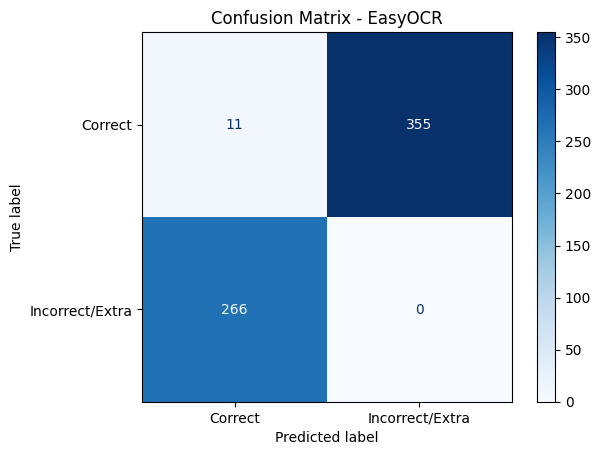

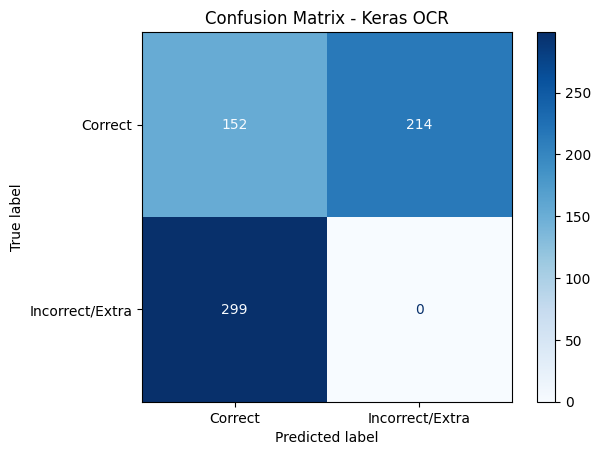

In [21]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

def show_conf_matrix(pred_df, annot_df, image_ids, title=''):
    y_true_all = []
    y_pred_all = []

    for img_id in image_ids:
        gt_texts = set(annot_df[annot_df['image_id'] == img_id]['gt_text'])
        pred_texts = set(pred_df[pred_df['img_id'] == img_id]['text'])

        for word in gt_texts:
            y_true_all.append(1)
            y_pred_all.append(1 if word in pred_texts else 0)

        for word in pred_texts - gt_texts:
            y_true_all.append(0)
            y_pred_all.append(1)

    cm = confusion_matrix(y_true_all, y_pred_all, labels=[1, 0])
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["Correct", "Incorrect/Extra"])
    disp.plot(cmap='Blues', values_format='d')
    plt.title(f'Confusion Matrix - {title}')
    plt.show()

# Display confusion matrices
show_conf_matrix(easyocr_df, annot_subset, image_ids_subset, title='EasyOCR')
show_conf_matrix(kerasocr_df, annot_subset, image_ids_subset, title='Keras OCR')


**Word-level Missed Predictions Table**
This helps see what exact words were missed or added by each model for each image.

In [22]:
def show_missed_predictions(pred_df, annot_df, image_ids, model_name):
    print(f"\n🔍 Missed predictions for {model_name}:\n")
    for img_id in image_ids:
        gt_texts = set(annot_df[annot_df['image_id'] == img_id]['gt_text'])
        pred_texts = set(pred_df[pred_df['img_id'] == img_id]['text'])

        missed = gt_texts - pred_texts
        extras = pred_texts - gt_texts

        if missed or extras:
            print(f'📷 Image ID: {img_id}')
            if missed:
                print(f' ❌ Missed: {missed}')
            if extras:
                print(f' ➕ Extra: {extras}')
            print()

# Show for both models
show_missed_predictions(easyocr_df, annot_subset, image_ids_subset, "EasyOCR")
show_missed_predictions(kerasocr_df, annot_subset, image_ids_subset, "Keras OCR")



🔍 Missed predictions for EasyOCR:

📷 Image ID: f644219f560e3778
 ❌ Missed: {'golden', '.', 'ok-oyot', 'extra', 'system'}
 ➕ Extra: {'Ok-Oyot SYSTEM', 'EXTRA Golden', 'a5'}

📷 Image ID: c613956f36cbd5cd
 ❌ Missed: {'supuesto', 'concepto', 'auténtica', 'creatividad,', 'ha', 'una', 'primero', 'innovación', 'clase', 'revolución', 'paidós', 'xxl', 'en', 'creativa', 'que', 'florida', 'siglo', 'creativa.', 'empresa', 'de', 'transformación', 'identificar', 'cultura', 'talento:', 'del', 'richard', 'y', 'la', 'ocio', 'trabajo', 'es'}
 ➕ Extra: {'LA CLASE', 'del trabajo y el ocio en el siglo XXI', 'CREATIVA', 'EMIPRESA', 'La transformacion de Ia cultura', 'Richard Florida es el primero en identificar', 'revolucion en Ia creatividad, Ia innovacion', 'y el talento: Ia clase creativa.', 'concepto que ha supuesto una autentica', 'Richard Florida', 'PAIDOS'}

📷 Image ID: 0aedf408c1823ee1
 ❌ Missed: {'for', 'and', 'collection', 'r', 'w', 'to', 'cs', 'the', 'illustrato', 'publishing', 'vb', 'pro', 'pro